In [136]:
!date

Thu Mar 10 16:46:30 PST 2022


# Celltype assignment
#### Unfiltered data obtained from using kb with multimapping function. Ref genome includes WRE.

___

In [137]:
%config InlineBackend.figure_format = 'retina'
%load_ext blackcellmagic

The blackcellmagic extension is already loaded. To reload it, use:
  %reload_ext blackcellmagic


In [138]:
import sys
import anndata
# import scvi

import scanpy as sc
import numpy as np
from scipy import stats

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns

import pandas as pd

sc.set_figure_params(figsize=(6, 6), frameon=False)
sc.settings.n_jobs=2

In [139]:
# set random seed
np.random.seed(926)

In [140]:
def nd(arr):
    """
    Funciton to transform numpy matrix to nd array.
    """
    return np.asarray(arr).reshape(-1)

___

# Read data from AnnData object

In [141]:
adata = anndata.read_h5ad("../../../finchseq_data/all_leiden_renormalized.h5ad")
adata

AnnData object with n_obs × n_vars = 35804 × 22151
    obs: 'species', 'batch', 'n_counts_processed', 'batch_index', 'n_counts_raw', 'leiden'
    var: 'gene_name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

Create copy of adata to run rank_genes_groups on marker genes only:

In [142]:
adata_test = adata.copy()

___

# DE genes in Leiden clusters

In [143]:
sc.tl.rank_genes_groups(adata, groupby='leiden', method='t-test', corr_method="bonferroni", use_raw=False)

Score = z-score underlying the computation of a p-value for each gene for each group

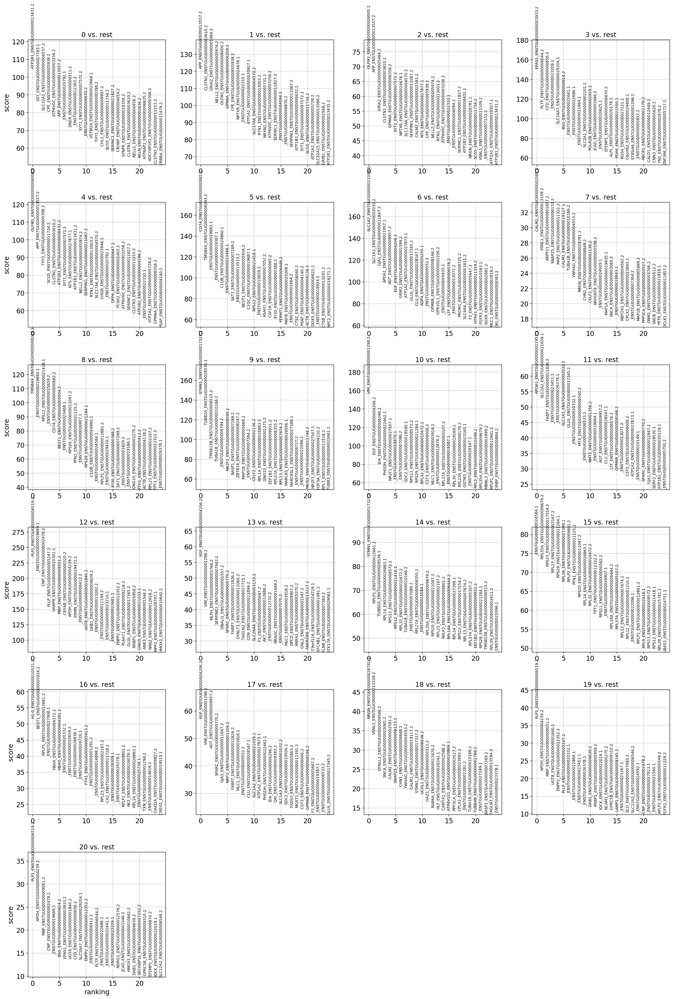

In [144]:
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, save=True)

Show the 10 top ranked genes per cluster:

In [145]:
leiden_markers = pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(25)
leiden_markers

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,ATP1B1_ENSTGUG00000013431.2,APP_ENSTGUG00000013557.2,OLFM1_ENSTGUG00000006000.2,EPAS1_ENSTGUG00000003933.2,OLFM1_ENSTGUG00000006000.2,CD74_ENSTGUG00000000882.2,SLC1A2_ENSTGUG00000021059.1,CALM2_ENSTGUG00000002581.2,TMSB4X_ENSTGUG00000008243.2,STMN1_ENSTGUG00000017327.2,...,APOA1_ENSTGUG00000021957.1,PLP1_ENSTGUG00000006519.2,EGF_ENSTGUG00000004206.2,STMN1_ENSTGUG00000017327.2,_ENSTGUG00000024584.1,H1-0_ENSTGUG00000010521.2,EGF_ENSTGUG00000004206.2,NRGN_ENSTGUG00000028781.1,PLP1_ENSTGUG00000006519.2,PLP1_ENSTGUG00000006519.2
1,SST_ENSTGUG00000027783.1,CLSTN1_ENSTGUG00000003610.2,APP_ENSTGUG00000013557.2,PLTP_ENSTGUG00000006044.2,APP_ENSTGUG00000013557.2,TMSB4X_ENSTGUG00000008243.2,SLC1A3_ENSTGUG00000002032.2,VSNL1_ENSTGUG00000013109.2,_ENSTGUG00000019883.1,TUBB2A_ENSTGUG00000028536.1,...,SLC1A2_ENSTGUG00000021059.1,_ENSTGUG00000019689.1,VIM_ENSTGUG00000001298.2,RPLP1_ENSTGUG00000012661.2,RPL35A_ENSTGUG00000009679.2,BEST1_ENSTGUG00000005934.2,VIM_ENSTGUG00000001298.2,VSNL1_ENSTGUG00000013109.2,APOH_ENSTGUG00000004239.2,APOH_ENSTGUG00000004239.2
2,SLC32A1_ENSTGUG00000004537.2,GRIA2_ENSTGUG00000005484.2,GRIA2_ENSTGUG00000005484.2,CFD_ENSTGUG00000000656.2,THY1_ENSTGUG00000000398.2,_ENSTGUG00000019883.1,GJA1_ENSTGUG00000011847.2,ARPP21_ENSTGUG00000001697.2,RPS12_ENSTGUG00000021418.1,TMSB15B_ENSTGUG00000006515.2,...,FABP7_ENSTGUG00000011826.2,CNP_ENSTGUG00000002478.2,MLPH_ENSTGUG00000003766.2,TUBB2A_ENSTGUG00000028536.1,RPS23_ENSTGUG00000017554.2,RPLP1_ENSTGUG00000012661.2,AGT_ENSTGUG00000009957.2,DYNLL1_ENSTGUG00000009566.2,MBP_ENSTGUG00000009051.2,MBP_ENSTGUG00000009051.2
3,CPE_ENSTGUG00000005938.2,NELL2_ENSTGUG00000005974.2,CLSTN1_ENSTGUG00000003610.2,_ENSTGUG00000023209.1,SCG5_ENSTGUG00000011734.2,_ENSTGUG00000019387.1,APOA1_ENSTGUG00000021957.1,SNAP25_ENSTGUG00000006133.2,_ENSTGUG00000015659.2,TUBA1B_ENSTGUG00000010166.2,...,_ENSTGUG00000023451.1,PLLP_ENSTGUG00000005247.2,SERPINE2_ENSTGUG00000007943.2,RPL14_ENSTGUG00000026863.1,RPL23_ENSTGUG00000002167.2,_ENSTGUG00000027908.1,SPARC_ENSTGUG00000000770.2,SNCA_ENSTGUG00000003065.2,UGT8_ENSTGUG00000001840.2,CNP_ENSTGUG00000002478.2
4,ATP6V0C_ENSTGUG00000003256.2,OLFM1_ENSTGUG00000006000.2,GPM6A_ENSTGUG00000006358.2,SLC16A7_ENSTGUG00000029204.1,CLSTN1_ENSTGUG00000003610.2,C1QB_ENSTGUG00000024860.1,AGT_ENSTGUG00000009957.2,MAP2_ENSTGUG00000011322.2,CD74_ENSTGUG00000000882.2,_ENSTGUG00000009794.2,...,_ENSTGUG00000026378.1,VAMP8_ENSTGUG00000020301.1,DNALI1_ENSTGUG00000001557.2,RPS13_ENSTGUG00000008572.2,RPS29_ENSTGUG00000021284.1,HBAA_ENSTGUG00000004372.2,GJA1_ENSTGUG00000011847.2,CALM2_ENSTGUG00000002581.2,ENPP2_ENSTGUG00000012352.2,_ENSTGUG00000019689.1
5,APP_ENSTGUG00000013557.2,GPM6A_ENSTGUG00000006358.2,SYT1_ENSTGUG00000007572.2,BSG_ENSTGUG00000000614.2,ATP1B3_ENSTGUG00000008432.2,_ENSTGUG00000023468.1,EGF_ENSTGUG00000004206.2,CALM1_ENSTGUG00000019117.1,BEST1_ENSTGUG00000005934.2,NR2F2_ENSTGUG00000008599.2,...,SLC1A3_ENSTGUG00000002032.2,MBP_ENSTGUG00000009051.2,SPARC_ENSTGUG00000000770.2,RPS12_ENSTGUG00000021418.1,RPL34_ENSTGUG00000027399.1,HBAD_ENSTGUG00000004381.2,NMT2_ENSTGUG00000001356.2,SNAP25_ENSTGUG00000006133.2,PLLP_ENSTGUG00000005247.2,BSG_ENSTGUG00000000614.2
6,_ENSTGUG00000020792.1,CPE_ENSTGUG00000005938.2,NPTXR_ENSTGUG00000024678.1,_ENSTGUG00000021641.1,SYT1_ENSTGUG00000007572.2,SAT1_ENSTGUG00000007289.2,GRM3_ENSTGUG00000002399.2,TUBA1B_ENSTGUG00000010166.2,_ENSTGUG00000023468.1,BASP1_ENSTGUG00000007269.2,...,GLUL_ENSTGUG00000017345.2,CRYAB_ENSTGUG00000000320.2,FABP7_ENSTGUG00000011826.2,RPL32_ENSTGUG00000010472.2,RPLP2_ENSTGUG00000009801.2,_ENSTGUG00000020332.1,FABP7_ENSTGUG00000011826.2,CHN1_ENSTGUG00000008848.2,_ENSTGUG00000020332.1,EPAS1_ENSTGUG00000003933.2
7,DNER_ENSTGUG00000008311.2,NPTXR_ENSTGUG00000024678.1,SLC17A6_ENSTGUG00000004570.2,_ENSTGUG00000022686.1,NTS_ENSTGUG00000027877.1,_ENSTGUG00000013513.2,ATP1A2_ENSTGUG00000027873.1,YWHAG_ENSTGUG00000004553.2,RPS20_ENSTGUG00000011097.2,ZBTB18_ENSTGUG000000

In [146]:
# leiden_markers.to_csv("leiden_marker_genes.csv", index=False)

___

# Load previously known marker genes

In [147]:
marker_gene_mat = pd.read_excel('../marker_genes.xlsx', sheet_name="matrix_v2")

Find gene ID for each gene:

In [148]:
marker_gene_mat["gene_name_id"] = np.arange(len(marker_gene_mat))

In [149]:
# index counter
i = 0

for gene in marker_gene_mat["Gene"].values:
    gene_name_id = []
    
    if gene.startswith("ENS"):
        gni = adata.var.iloc[np.where(adata.var.index.str.contains(gene))]
    
    else:
        gni = adata.var.iloc[np.where(adata.var.index.str.startswith(gene))]

    if len(gni) > 0:
        gene_name_id = gni.index[0]
    else:
        gene_name_id = np.nan

    marker_gene_mat["gene_name_id"][i] = gene_name_id
    i += 1

/home/lauraluebbert/bin/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/lauraluebbert/bin/miniconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


### !!! Check which/if genes were found correctly:

In [150]:
marker_gene_mat[["Gene", "gene_name_id"]]

,Gene,gene_name_id
0,SLC15A2,SLC15A2_ENSTGUG00000026244.1
1,SPEF2,SPEF2_ENSTGUG00000001981.2
2,PLP1,PLP1_ENSTGUG00000006519.2
3,CSF1R,CSF1R_ENSTGUG00000000965.2
4,FLI1,FLI1_ENSTGUG00000020175.1
...,...,...
67,MAP3K8,MAP3K8_ENSTGUG00000001055.2
68,IFIH1,IFIH1_ENSTGUG00000006914.2
69,STEAP4,STEAP4_ENSTGUG00000001423.2
70,TOR1B,TOR1B_ENSTGUG00000004451.2


Notes on the marker genes:  
FNDC9 is a synonym for FNTM2 (HVC-X marker).  
PDGFRA (ENSTGUG00000007756.2) not annotated.  
or107-1 is a synonym for ZF1A (neither, not even ensembl ID, can be found in ref).  
Ki67 (ENSTGUG00000021193) not annotated. 

SOX4 and PDGFRA not in reference genome gtf. This is weird because Colquitt et al report using them as a markers and they use the same ref. genome.

ZF1A, EJZER1, and AR46s also not in ref gtf (not used in Colquitt paper).

In [151]:
# Drop rows with genes not found in dataset
marker_gene_mat = marker_gene_mat.dropna(axis=0)

# Drop columns of celltypes containing only 0s
marker_gene_mat = marker_gene_mat.loc[:, (marker_gene_mat != 0).any(axis=0)]
 
#Set gene_name_id as index and drop "gene" coplumn
marker_gene_mat = marker_gene_mat.set_index("gene_name_id")
marker_gene_mat = marker_gene_mat.drop("Gene", axis=1)

marker_gene_mat

,neuron,glia,vascular,astrocytes,ependymal cells,oligodendrocytes,oligodendrocyte precursor cells,microglia,radial glia,vascular endothelial cells,...,RA,GABAergic neuroblast,adult neural stem cells,migrating neuroblasts,mitochondrial,apoptosis,mammalian neurogenesis,immediate early genes,proliferation,immune response
gene_name_id,,,,,,,,,,,,,,,,,,,,,
SLC15A2_ENSTGUG00000026244.1,0,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SPEF2_ENSTGUG00000001981.2,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
PLP1_ENSTGUG00000006519.2,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CSF1R_ENSTGUG00000000965.2,0,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
FLI1_ENSTGUG00000020175.1,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MAP3K8_ENSTGUG00000001055.2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
IFIH1_ENSTGUG00000006914.2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
STEAP4_ENSTGUG00000001423.2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


___

# Check gene expression of previously known marker genes in Leiden clusters

In [152]:
# sc.pl.dotplot(
#     adata,
#     marker_gene_mat.index.values,
#     groupby="leiden",
#     title="Marker gene expression in Leiden clusters",
#     use_raw=False,
#     swap_axes=True
# )

In [153]:
# sc.pl.stacked_violin(adata, 
#                      marker_gene_mat.index.values, 
#                      groupby='leiden', 
#                      title="Marker gene expression in Leiden clusters", 
#                      rotation=90, 
#                      sharey=True,
#                      use_raw=False,
#                      swap_axes=True
#                     )

# Run sc.tl.rank_genes_groups() using only marker genes

Remove all marker genes that do not specify a celltype (e.g. connecitivty (HVC-X, HVC-RA), mammalian neurogenesis, immediate early genes, etc.):

In [154]:
# Drop categories that I do not need for this analysis
marker_mat = marker_gene_mat.filter(["astrocytes", "ependymal cells", "oligodendrocytes", "oligodendrocyte precursor cells", "microglia", "radial glia", "vascular endothelial cells", "mural cells", "red blood cells", "leptomeningeal cells", "glutamatergic neurons", "GABAergic neurons", "dopaminergic neurons", "noradrenergic neurons", "GABAergic neuroblast", "adult neural stem cells", "migrating neuroblasts"], axis=1)
# Drop rows of genes containing only 0s
marker_mat = marker_mat.loc[(marker_mat!=0).any(axis=1)]

In [155]:
marker_mat

,astrocytes,ependymal cells,oligodendrocytes,oligodendrocyte precursor cells,microglia,radial glia,vascular endothelial cells,mural cells,red blood cells,leptomeningeal cells,glutamatergic neurons,GABAergic neurons,dopaminergic neurons,noradrenergic neurons,GABAergic neuroblast,adult neural stem cells,migrating neuroblasts
gene_name_id,,,,,,,,,,,,,,,,,
SLC15A2_ENSTGUG00000026244.1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
SPEF2_ENSTGUG00000001981.2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
PLP1_ENSTGUG00000006519.2,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
CSF1R_ENSTGUG00000000965.2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
FLI1_ENSTGUG00000020175.1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
RGS5_ENSTGUG00000019064.1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
LUM_ENSTGUG00000008175.2,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
HBAD_ENSTGUG00000004381.2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
SLC17A6_ENSTGUG00000004570.2,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0


In [156]:
# Find indices of all marker genes in adata
ens_idx = np.isin(adata_test.var_names, marker_mat.index.values)

# Slice adata based on these indices
adata_test = adata_test[:,ens_idx].copy()
adata_test

AnnData object with n_obs × n_vars = 35804 × 22
    obs: 'species', 'batch', 'n_counts_processed', 'batch_index', 'n_counts_raw', 'leiden'
    var: 'gene_name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [157]:
adata_test.var

,gene_name,highly_variable,means,dispersions,dispersions_norm
CALB1_ENSTGUG00000011825.2,CALB1,True,0.114989,2.102206,0.640606
DDC_ENSTGUG00000007930.2,DDC,False,0.003895,1.712888,0.290124
GAD2_ENSTGUG00000001148.2,GAD2,True,0.327763,2.535724,1.030880
VIM_ENSTGUG00000001298.2,VIM,True,0.675490,2.131368,0.666859
NECTIN3_ENSTGUG00000013600.2,NECTIN3,True,0.221576,2.229994,0.755647
NR2E1_ENSTGUG00000012147.2,NR2E1,False,0.074036,1.028063,-0.326389
SPEF2_ENSTGUG00000001981.2,SPEF2,False,0.014418,0.936840,-0.408513
_ENSTGUG00000007756.2,,True,0.086860,3.432771,1.838444
PVALB_ENSTGUG00000010713.2,PVALB,True,0.678322,3.707819,2.086056
LUM_ENSTGUG00000008175.2,LUM,False,0.002382,2.177289,0.708199


In [158]:
sc.tl.rank_genes_groups(adata_test, groupby='leiden', method='t-test', corr_method="bonferroni", use_raw=False)

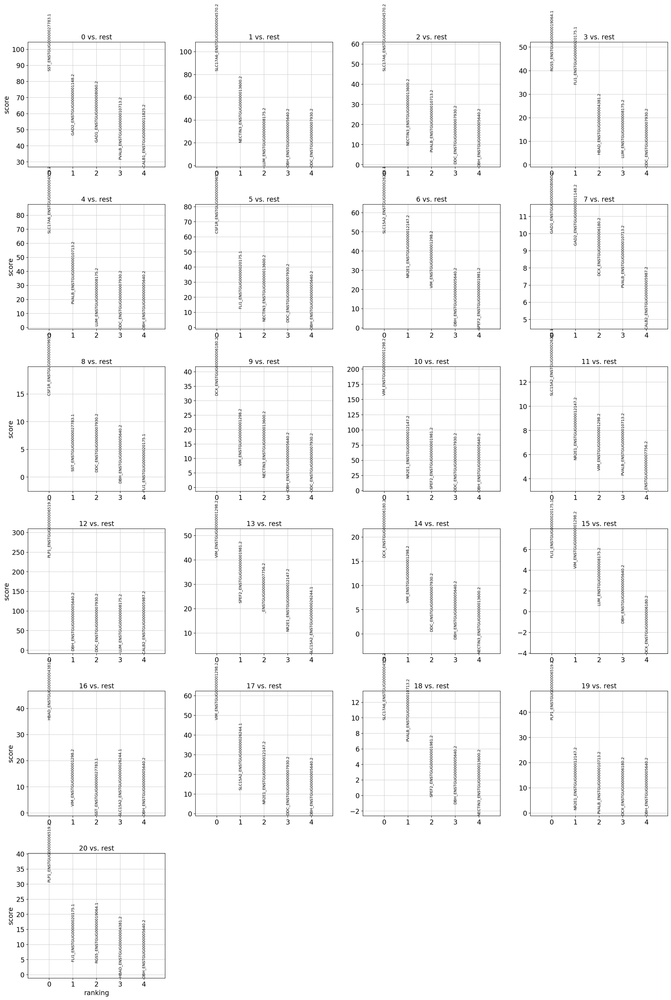

In [159]:
sc.pl.rank_genes_groups(adata_test, n_genes=5, sharey=False, save=False)

### Assign celltypes manually based on marker gene expression in each Leiden cluster

In [160]:
df_leiden = pd.DataFrame()
df_leiden["cluster"] = np.arange(21)
df_leiden["celltype"] = [
    "GABAergic neurons 1",
    "glutamatergic neurons 1",
    "glutamatergic neurons 2",
    "mural / vascular endothelial cells 1",
    "glutamatergic neurons 3",
    "microglia 1",    
    "astrocytes 1",   
    "GABAergic neurons 2",
    "microglia 2",    
    "migrating neuroblasts 1",
    "radial glia 1",
    "astrocytes 2",
    "oligodendrocytes 1",
    "radial glia 2",   
    "migrating neuroblasts 2",
    "radial glia / vascular endothelial cells",
    "red blood cells",
    "radial glia 3",
    "glutamatergic neurons 4",
    "oligodendrocytes 2",
    "oligodendrocytes 3",  
]

df_leiden

,cluster,celltype
0,0,GABAergic neurons 1
1,1,glutamatergic neurons 1
2,2,glutamatergic neurons 2
3,3,mural / vascular endothelial cells 1
4,4,glutamatergic neurons 3
5,5,microglia 1
6,6,astrocytes 1
7,7,GABAergic neurons 2
8,8,microglia 2
9,9,migrating neuroblasts 1


___

# Add manually defined celltypes to AnnData object

In [161]:
# Create copy of leiden cluster column to store manually assigned celltypes
adata.obs["celltype"] = adata.obs.leiden.copy()

In [162]:
# Relabel the clusters in celltype
adata.rename_categories("celltype", df_leiden["celltype"].values)

In [163]:
adata.obs.head()

,species,batch,n_counts_processed,batch_index,n_counts_raw,leiden,celltype
barcode,,,,,,,
AAACCCAAGCACTGGA-0,zebrafinch,control1,483.000000,0,483.000000,3,mural / vascular endothelial cells 1
AAACCCAAGCGTCAAG-0,zebrafinch,control1,946.000061,0,946.000061,5,microglia 1
AAACCCAAGGTCACAG-0,zebrafinch,control1,1068.000000,0,1068.000000,0,GABAergic neurons 1
AAACCCAAGTCATTGC-0,zebrafinch,control1,1407.000000,0,1407.000000,6,astrocytes 1
AAACCCAAGTGCTACT-0,zebrafinch,control1,1060.000000,0,1060.000000,0,GABAergic neurons 1


___

# Celltype stats

Show number of cells for each celltype:

In [164]:
df_leiden["total number of cells"] = adata.obs.groupby("leiden").size().values.astype(int)
df_leiden = df_leiden.sort_values(["celltype"])

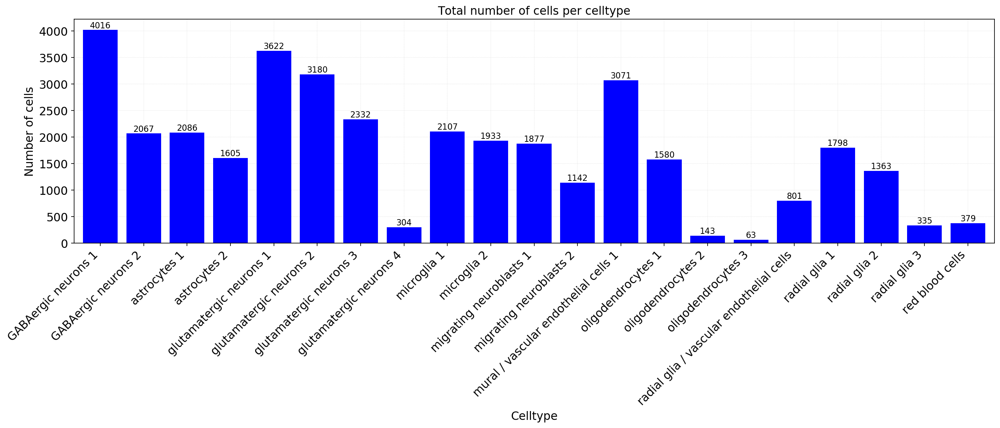

In [165]:
fig, ax = plt.subplots(figsize=(20,5))

clusters = df_leiden["celltype"].values
values = df_leiden["total number of cells"].values

ax.bar(clusters, values, color="blue")

# Add value above each bar
for index, value in enumerate(values):
    ax.text(x = index, y = value + 40, s = value, size = 10, ha='center')

ax.set_xticklabels(clusters, rotation = 45, ha="right")

ax.set(**{
    "title": "Total number of cells per celltype",
    "ylabel": "Number of cells",
    "xlabel": "Celltype"
})

ax.margins(x=0.01)
ax.grid(True, ls='--', lw=0.2)
ax.set_axisbelow(True)

fig.show()

## Does each celltype cluster contain an equal number of cells from each batch/dataset?

Let's look at the actual number of cells from each batch for each celltype:

In [166]:
# Normalize each celltype count to total number of cells in that batch by dividing
df_normalized = (adata.obs.groupby("celltype")["batch"].value_counts() / adata.obs.groupby("batch")["species"].count()).unstack().fillna(0)
df_normalized.columns = df_normalized.columns.astype(str)
df_normalized["total normalized count"] = df_normalized.sum(axis=1).values

df_normalized["control1_fraction"] = (df_normalized["control1"] / df_normalized["total normalized count"]).values
df_normalized["control2_fraction"] = (df_normalized["control2"] / df_normalized["total normalized count"]).values
df_normalized["experiment1_fraction"] = (df_normalized["experiment1"] / df_normalized["total normalized count"]).values
df_normalized["experiment2_fraction"] = (df_normalized["experiment2"] / df_normalized["total normalized count"]).values

df_normalized["total cellcount"] = adata.obs.groupby("celltype").size().values.astype(int)

df_normalized

batch,control1,control2,experiment1,experiment2,total normalized count,control1_fraction,control2_fraction,experiment1_fraction,experiment2_fraction,total cellcount
celltype,,,,,,,,,,
GABAergic neurons 1,0.119123,0.152142,0.108357,0.089355,0.468977,0.254006,0.324411,0.231050,0.190533,4016
glutamatergic neurons 1,0.100072,0.128824,0.140929,0.063477,0.433302,0.230952,0.297308,0.325245,0.146495,3622
glutamatergic neurons 2,0.101506,0.069125,0.059824,0.106608,0.337062,0.301148,0.205081,0.177485,0.316286,3180
mural / vascular endothelial cells 1,0.091673,0.089962,0.082533,0.081055,0.345222,0.265547,0.260591,0.239072,0.234790,3071
glutamatergic neurons 3,0.091468,0.130313,0.056709,0.017415,0.295905,0.309112,0.440387,0.191646,0.058855,2332
microglia 1,0.044863,0.026129,0.088762,0.067301,0.227055,0.197587,0.115076,0.390927,0.296410,2107
astrocytes 1,0.033596,0.061353,0.042434,0.086263,0.223646,0.150220,0.274329,0.189739,0.385712,2086
GABAergic neurons 2,0.061457,0.056722,0.050350,0.059896,0.228425,0.269045,0.248319,0.220424,0.262212,2067
microglia 2,0.028372,0.017033,0.096029,0.066162,0.207597,0.136671,0.082050,0.462575,0.318705,1933


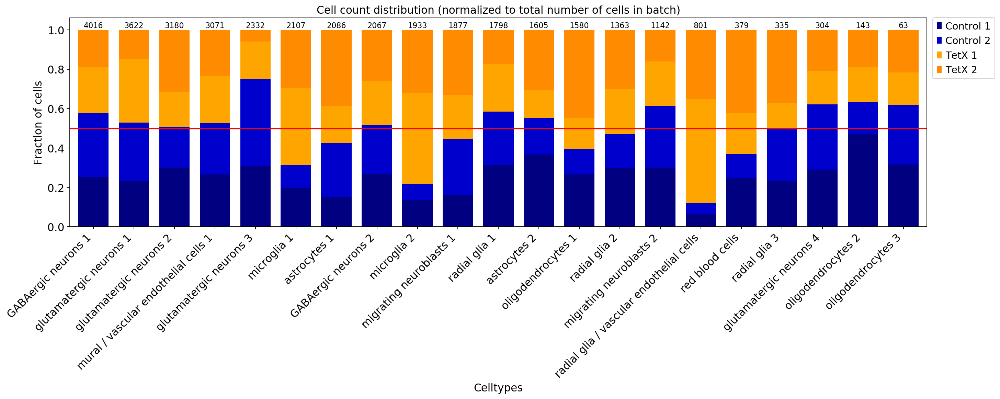

In [167]:
fig, ax = plt.subplots(figsize=(20, 5))
width = 0.75

clusters = df_normalized.index.values
cellcounts = df_normalized["total cellcount"].values

ax.bar(
    clusters,
    df_normalized["control1_fraction"].values,
    width,
    color="navy",
    label="Control 1",
)
ax.bar(
    clusters,
    df_normalized["control2_fraction"].values,
    width,
    bottom=df_normalized["control1_fraction"].values,
    color="mediumblue",
    label="Control 2",
)
ax.bar(
    clusters,
    df_normalized["experiment1_fraction"].values,
    width,
    bottom=df_normalized["control2_fraction"].values
    + df_normalized["control1_fraction"].values,
    color="orange",
    label="TetX 1",
)
ax.bar(
    clusters,
    df_normalized["experiment2_fraction"].values,
    width,
    bottom=df_normalized["experiment1_fraction"].values
    + df_normalized["control2_fraction"].values
    + df_normalized["control1_fraction"].values,
    color="darkorange",
    label="TetX 2",
)

# Add value above each bar
for index, value in enumerate(cellcounts):
    ax.text(x = index, y = 1.01, s = value, size = 10, ha='center')

ax.set_xticklabels(clusters, rotation=45, ha="right")

ax.legend(bbox_to_anchor=(1.001, 1.025), loc="upper left")

ax.set(
    **{
        "title": "Cell count distribution (normalized to total number of cells in batch)",
        "ylabel": "Fraction of cells",
        "xlabel": "Celltypes"
    }
)

ax.axhline(y=0.5, color="r", linestyle="-")

ax.margins(x=0.01, y=0.06)
ax.grid(False)

fig.show()

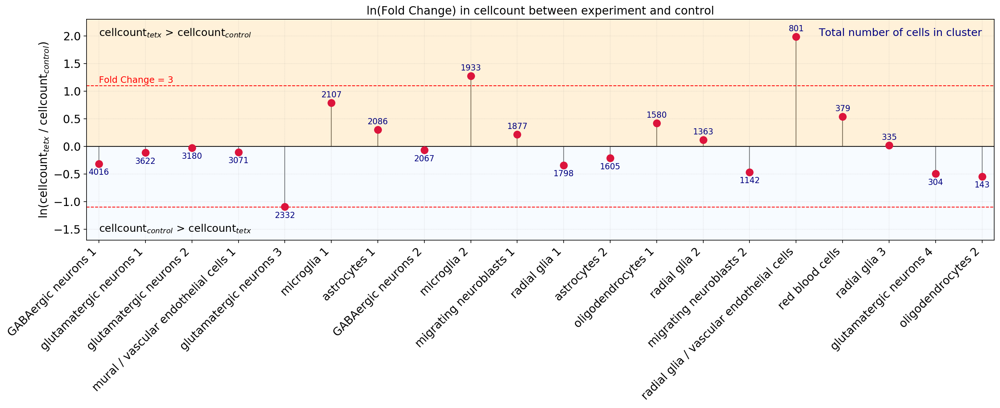

In [168]:
fig, ax = plt.subplots(figsize=(20, 5))

exp = df_normalized[["experiment1", "experiment2"]].sum(axis=1)
ctrl = df_normalized[["control1", "control2"]].sum(axis=1)

x = df_normalized.index.values
y = []
cell_counts = df_normalized["total cellcount"].values
cell_color = "navy"

counter = 0
del_idx = []

# Calculate log(fold change)
for i, exp_value in enumerate(exp):
    if cell_counts[i] < 100:
        # Collect indeces of labels to delete from x labels
        del_idx.append(i)
        continue
    else:
        y_temp = np.log(exp_value / ctrl[i])
        y.append(y_temp)
        if exp_value >= ctrl[i]:
            ax.text(x = counter, y = y_temp + 0.1, s = cell_counts[i], size = 10, ha='center', c=cell_color)
        if ctrl[i] >= exp_value:
            ax.text(x = counter, y = y_temp - 0.2, s = cell_counts[i], size = 10, ha='center', c=cell_color)
        counter +=1

x = np.delete(x, del_idx)

# Plot stem/scatter plot
ax.vlines(x, 0, y, color="black", linestyle="-", lw=1, zorder=-1)
ax.scatter(x , y, c="crimson", s=75)

ax.set(
    **{
        "title": "ln(Fold Change) in cellcount between experiment and control",
        "ylabel": "ln(cellcount$_{tetx}$ / cellcount$_{control}$)",
        "ylim": (-1.7, 2.3)
        #     "xlabel": "Celltypes"
    }
)

# ax.set_yscale('log')

# labels = ["", "3", "2", "1", "0", "1", "2", "3"]
# ax.set_yticklabels(labels)

ax.axhline(y=0, color="black", linestyle="-", lw=1, zorder=-1)
ax.set_xticklabels(x, rotation=45, ha="right")

ax.text(0, np.log(3)+0.05, "Fold Change = 3", ha="left", size=11, c='red')
ax.axhline(y=np.log(3), color="red", linestyle="--", lw=1, zorder=-1)
ax.axhline(y=-np.log(3), color="red", linestyle="--", lw=1, zorder=-1)

# Add blocks and text separating each comparison category
ax.axhspan(-1.7, 0, facecolor='aliceblue', alpha=0.5, zorder=-1)
ax.axhspan(0, 2.3, facecolor='moccasin', alpha=0.5, zorder=-1)
ax.text(0, -1.55, "cellcount$_{control}$ > cellcount$_{tetx}$", ha="left", size=13)
ax.text(0, 2, "cellcount$_{tetx}$ > cellcount$_{control}$", ha="left", size=13)
ax.text(19, 2, "Total number of cells in cluster", ha="right", c=cell_color, size=13)

ax.margins(x=0.01, y=0.01)
ax.grid(False)
ax.xaxis.grid(color='gray', ls='--', lw=0.1)
ax.yaxis.grid(color='gray', ls='--', lw=0.1)
ax.set_axisbelow(True)

fig.show()

### Plot UMAP with manually assigned celltypes:

In [169]:
# Desired order of the clusters
clusters = np.sort(df_leiden["celltype"].values)

# Reordering celltype labels using categorical data type
adata.obs["celltype"] = adata.obs["celltype"].cat.reorder_categories(list(clusters))

# Reordering leiden labels using categorical data type (so order is same as celltype labels)
adata.obs["leiden"] = adata.obs["leiden"].cat.reorder_categories(list(df_leiden["cluster"].values.astype(str)))

In [170]:
# Define cluster colors
palette = [
    "orangered",
    "coral",
    "darkblue",
    "cornflowerblue",
    "darkgreen",
    "seagreen",
    "mediumseagreen",
    "yellowgreen",
    "indigo", 
    "mediumpurple",
    "hotpink",
    "pink",
    "teal",
    "mediumturquoise",
    "darkorange",
    "moccasin",
    "gold",
    "violetred",
    "mediumvioletred",
    "orchid",
    "firebrick",
]

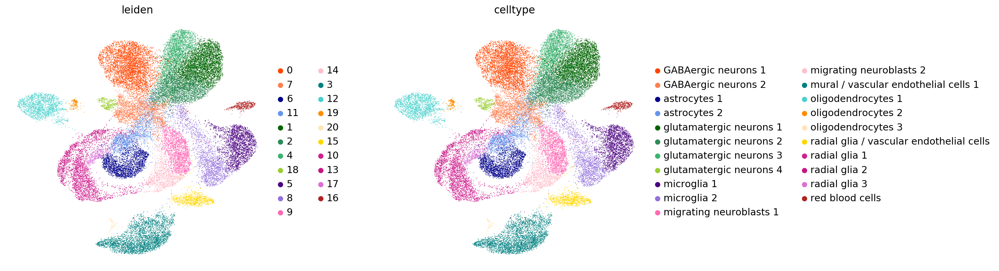

In [171]:
# Plot UMAP and color by Leiden clusters and batch
sc.pl.umap(adata, 
           color=["leiden", "celltype"],
           palette=palette,
           wspace=0.3,
#            arrows=True,
#            projection="3d"
          ) 

___

# Expression of mitochondrial markers per celltype

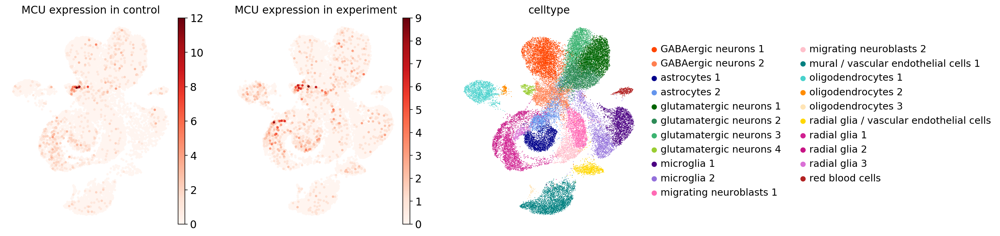

In [172]:
fig, axs = plt.subplots(figsize=(15,5), ncols=3)

gene = "MCU_ENSTGUG00000004428.2"
condition = ["control", "experiment"]
color_map = "Reds"
vmin = 0
size = 40

sc.pl.umap(adata[np.char.startswith(nd(adata.obs.batch.values).astype(str), condition[0])], color=gene, title="{} expression in {}".format(gene.split("_")[0], condition[0]), size=size, color_map=color_map, vmin=vmin, use_raw=True, show=False, ax=axs[0])
sc.pl.umap(adata[np.char.startswith(nd(adata.obs.batch.values).astype(str), condition[1])], color=gene, title="{} expression in {}".format(gene.split("_")[0], condition[1]), size=size, color_map=color_map, vmin=vmin, use_raw=True, show=False, ax=axs[1])
sc.pl.umap(adata, color="celltype", show=False, ax=axs[2])

___

# Heatmaps showing expression of known marker genes per celltype 

In [173]:
# Define markers in order of celltypes
markers = [
    "GAD1_ENSTGUG00000008060.2",
    "GAD2_ENSTGUG00000001148.2",
    "SST_ENSTGUG00000027783.1",
    "PVALB_ENSTGUG00000010713.2",
    "CALB1_ENSTGUG00000011825.2",
    "CALB2_ENSTGUG00000005987.2",
    "SLC15A2_ENSTGUG00000026244.1",
    "SLC17A6_ENSTGUG00000004570.2",
    "CSF1R_ENSTGUG00000000965.2",
    "DCX_ENSTGUG00000006180.2",
    "RGS5_ENSTGUG00000019064.1",
    "FLI1_ENSTGUG00000020175.1",
    "_ENSTGUG00000007756.2",
    "PLP1_ENSTGUG00000006519.2",
    "VIM_ENSTGUG00000001298.2",
    "HBAD_ENSTGUG00000004381.2",
#         "SPEF2_ENSTGUG00000001981.2",
#         "LUM_ENSTGUG00000008175.2",
#         "DDC_ENSTGUG00000007930.2",
#         "DBH_ENSTGUG00000005640.2",
#         "NR2E1_ENSTGUG00000012147.2",
#         "NECTIN3_ENSTGUG00000013600.2",
]

# Define marker groups
var_groups = [
    (0, 5),
    (6, 6),
    (7, 7),
    (8, 8),
    (9, 9),
    (10, 10),
    (11, 11),
    (12, 12),
    (13, 13),
    (14, 14),
    (15, 15)
]

# Define marker group labels
var_labels = [
    "GABAergic neurons",
    "astrocytes",
    "glutamatergic neurons",
    "microglia",
    "migrating neuroblasts",
    "mural cells",
    "vascular endothelial cells",
    "oligodendrocyte precursor cells",
    "oligodendrocytes",
    "radial glia",
    "red blood cells",
    #     "ependymal cells",
    #     "leptomeningeal cells",
    #     "dopaminergic neurons",
    #     "noradrenergic neurons",
    #     "adult neural stem cells",
    #     "GABAergic neuroblast",
]

Heatmap showing expression of previously known marker genes:

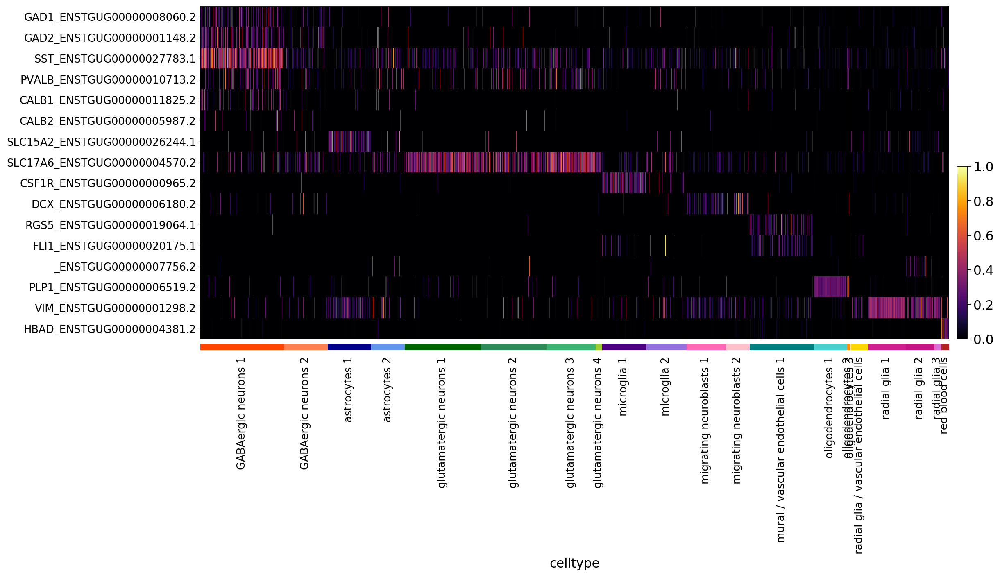

In [174]:
sc.pl.heatmap(
    adata,
    markers,
    groupby="celltype",
#     dendrogram=True, # This messes up the ordering of the celltypes
    show_gene_labels=True,
#     var_group_positions=var_groups,
#     var_group_labels=var_labels,
#     var_group_rotation=1,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=True,
    figsize=(15, 7)
)

### Marker for large GABAergic neurons in HVC

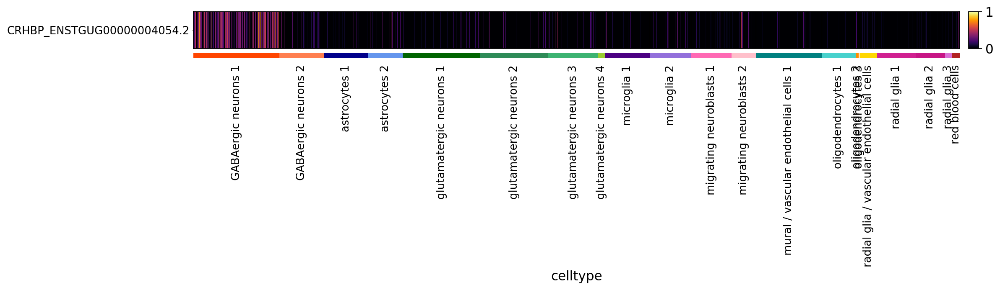

In [175]:
sc.pl.heatmap(
    adata,
    "CRHBP_ENSTGUG00000004054.2",
    groupby="celltype",
#     dendrogram=True, # This messes up the ordering of the celltypes
    show_gene_labels=True,
#     var_group_positions=var_groups,
#     var_group_labels=var_labels,
#     var_group_rotation=1,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=True,
    figsize=(15, 1)
)

### Potential marker for microglia found in RA by Alex

In [176]:
adata.var[adata.var.index.str.contains("RGS10")]

,gene_name,highly_variable,means,dispersions,dispersions_norm
RGS10_ENSTGUG00000023661.1,RGS10,True,0.349095,2.456872,0.959894


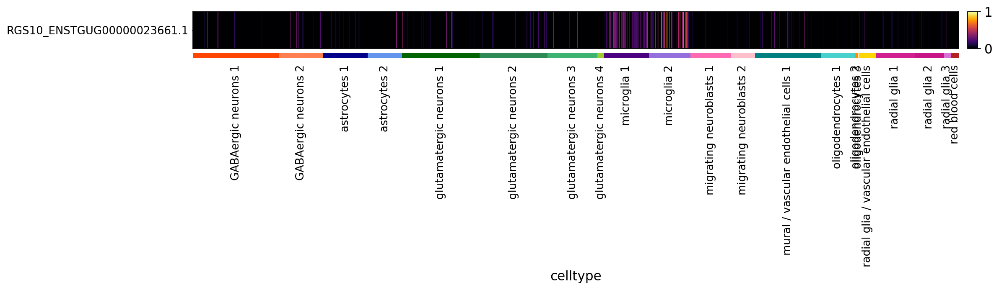

In [177]:
sc.pl.heatmap(
    adata,
    "RGS10_ENSTGUG00000023661.1",
    groupby="celltype",
#     dendrogram=True, # This messes up the ordering of the celltypes
    show_gene_labels=True,
#     var_group_positions=var_groups,
#     var_group_labels=var_labels,
#     var_group_rotation=1,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=True,
    figsize=(15, 1)
)

### Heatmap showing DE genes per celltype:

In [178]:
# Get first 5 DE genes for each Leiden cluster while making sure that cluster order is same as celltype order and remove duplications
l_markers = pd.unique(leiden_markers[df_leiden["cluster"].values.astype(str)].head(5).values.ravel('K')) #.ravel('K') makes sure that the values for each columns stay together instead of going per row

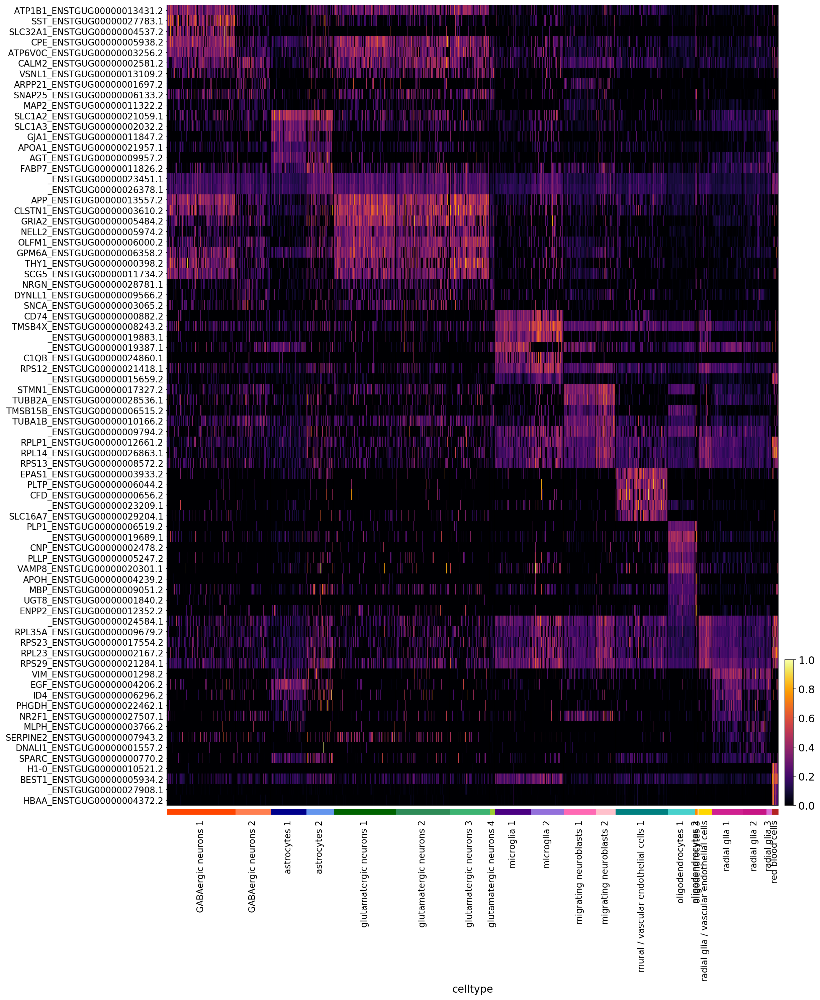

In [179]:
sc.pl.heatmap(
    adata,
    l_markers,
    groupby="celltype",
#     dendrogram=True, # This messes up the ordering of the celltypes
    show_gene_labels=True,
#     var_group_positions=var_groups,
#     var_group_labels=var_labels,
#     var_group_rotation=1,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=True,
    figsize=(15, 20),
    save=False
)

ENSTGUG00000015659 = Ferritin, higher subunit  
ENSTGUG00000019689 = Glutathione S-transferase-like    
ENSTGUG00000019883 = Class II histocompatibility antigen, B-L beta chain-like  
ENSTGUG00000023209 = Aldo-keto reductase family 1 member B1-like  
ENSTGUG00000023468 = novel gene  
ENSTGUG00000026378 = novel gene  
ENSTGUG00000026720 = novel gene  
ENSTGUG00000027908 = Hemoglobin subunit rho  

___

# Assign connectivity (HVC-X / HVC-RA) to glutamatergic neurons

In [180]:
# Drop categories that I do not need for this analysis
conn_mat = marker_gene_mat.filter(["HVC-RA", "HVC-X"], axis=1)
# Drop rows of genes containing only 0s
conn_mat = conn_mat.loc[(conn_mat!=0).any(axis=1)]
conn_mat

,HVC-RA,HVC-X
gene_name_id,,
UTS2B_ENSTGUG00000009278.2,1,0
HPCAL1_ENSTGUG00000013044.2,1,0
DCN_ENSTGUG00000008178.2,0,1
NTS_ENSTGUG00000027877.1,0,1
ALDH1A2_ENSTGUG00000006178.2,0,1
FNDC9_ENSTGUG00000000654.2,0,1


In [181]:
# Find indices of all marker genes in adata
ens_idx = np.isin(adata.var_names, conn_mat.index.values)

# Slice adata based on these indices
adata_conn = adata[:,ens_idx].copy()

# Remove all celltypes but glutamatergic neurons
adata_conn = adata_conn[np.char.startswith(nd(adata_conn.obs.celltype.values).astype(str), "glutamatergic neurons")]

adata_conn

View of AnnData object with n_obs × n_vars = 9438 × 6
    obs: 'species', 'batch', 'n_counts_processed', 'batch_index', 'n_counts_raw', 'leiden', 'celltype'
    var: 'gene_name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap', 'rank_genes_groups', 'celltype_colors'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [182]:
sc.tl.rank_genes_groups(adata_conn, groupby='celltype', method='t-test', corr_method="bonferroni", use_raw=False)

Trying to set attribute `.uns` of view, copying.


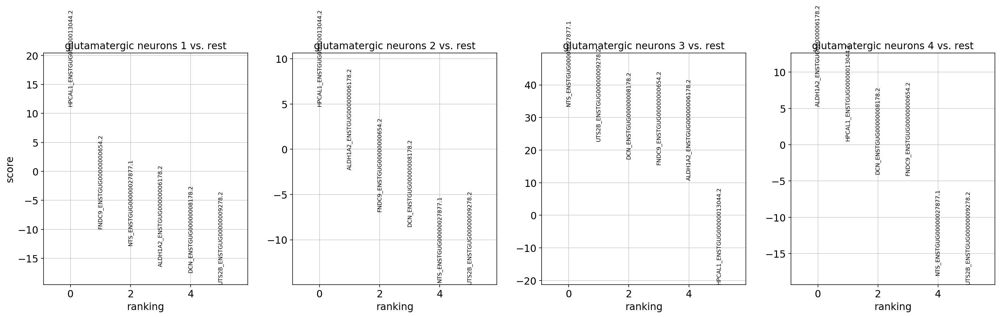

In [183]:
sc.pl.rank_genes_groups(adata_conn, n_genes=6, sharey=False, save=False, ncols=5)

Add assigned connectivity to adata.obs:

In [184]:
# Create copy of leiden cluster column to store manually assigned connectivity
adata.obs["connectivity"] = adata.obs.celltype.copy()

In [185]:
celltypes = nd(adata.obs.celltype.unique())
celltypes

df_connectivity = pd.DataFrame()
df_connectivity["celltypes"] = celltypes
# Using a range of numbers here, otherwise therename_categories function will not work
df_connectivity["connectivity"] = np.arange(len(celltypes))

# Assign connectivity
df_connectivity["connectivity"][df_connectivity["celltypes"]=="glutamatergic neurons 1"] = "undefined 1"
df_connectivity["connectivity"][df_connectivity["celltypes"]=="glutamatergic neurons 2"] = "undefined 2"
df_connectivity["connectivity"][df_connectivity["celltypes"]=="glutamatergic neurons 3"] = "HVC-X / HVC-RA"
df_connectivity["connectivity"][df_connectivity["celltypes"]=="glutamatergic neurons 4"] = "undefined 3"

# Sort by celltypes (otherwise rename categories does not work correctly)
df_connectivity = df_connectivity.sort_values("celltypes")
df_connectivity

/home/lauraluebbert/bin/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


,celltypes,connectivity
2,GABAergic neurons 1,2
9,GABAergic neurons 2,9
3,astrocytes 1,3
4,astrocytes 2,4
6,glutamatergic neurons 1,undefined 1
7,glutamatergic neurons 2,undefined 2
14,glutamatergic neurons 3,HVC-X / HVC-RA
17,glutamatergic neurons 4,undefined 3
1,microglia 1,1
10,microglia 2,10


In [186]:
adata.rename_categories("connectivity", df_connectivity["connectivity"].values)

In [187]:
adata.obs.head()

,species,batch,n_counts_processed,batch_index,n_counts_raw,leiden,celltype,connectivity
barcode,,,,,,,,
AAACCCAAGCACTGGA-0,zebrafinch,control1,483.000000,0,483.000000,3,mural / vascular endothelial cells 1,0
AAACCCAAGCGTCAAG-0,zebrafinch,control1,946.000061,0,946.000061,5,microglia 1,1
AAACCCAAGGTCACAG-0,zebrafinch,control1,1068.000000,0,1068.000000,0,GABAergic neurons 1,2
AAACCCAAGTCATTGC-0,zebrafinch,control1,1407.000000,0,1407.000000,6,astrocytes 1,3
AAACCCAAGTGCTACT-0,zebrafinch,control1,1060.000000,0,1060.000000,0,GABAergic neurons 1,2


### Plot glutamatergic neuron connectivity assignment

In [188]:
# Desired order of the connectivity clusters
conn_clusters = ["HVC-X / HVC-RA", "undefined 1", "undefined 2", "undefined 3", 2, 9, 3, 4, 1, 10, 13, 8, 0, 18, 12, 20, 15, 11, 16, 19, 5]

# Reordering connectivity labels using categorical data type
adata.obs["connectivity"] = adata.obs["connectivity"].cat.reorder_categories(list(conn_clusters))

In [189]:
palette_glut = [
    "crimson",
    "indigo",
    "orchid",
    "pink"
]

All glut neurons for reference:

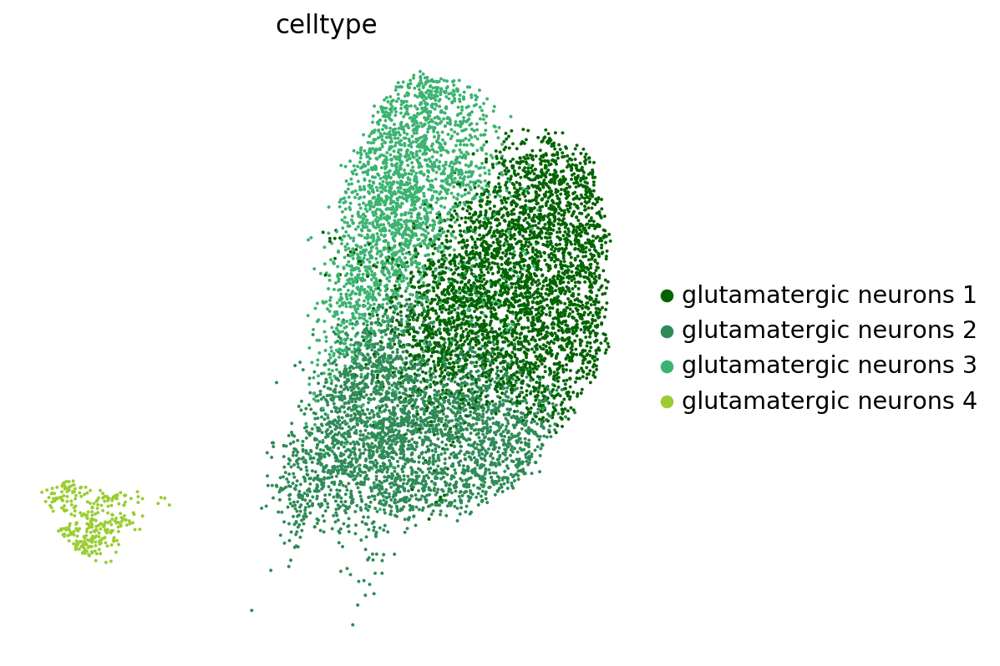

In [190]:
sc.pl.umap(
    adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")],
    color=["celltype"],
    ncols=1
)

Connectivity:

Trying to set attribute `.uns` of view, copying.


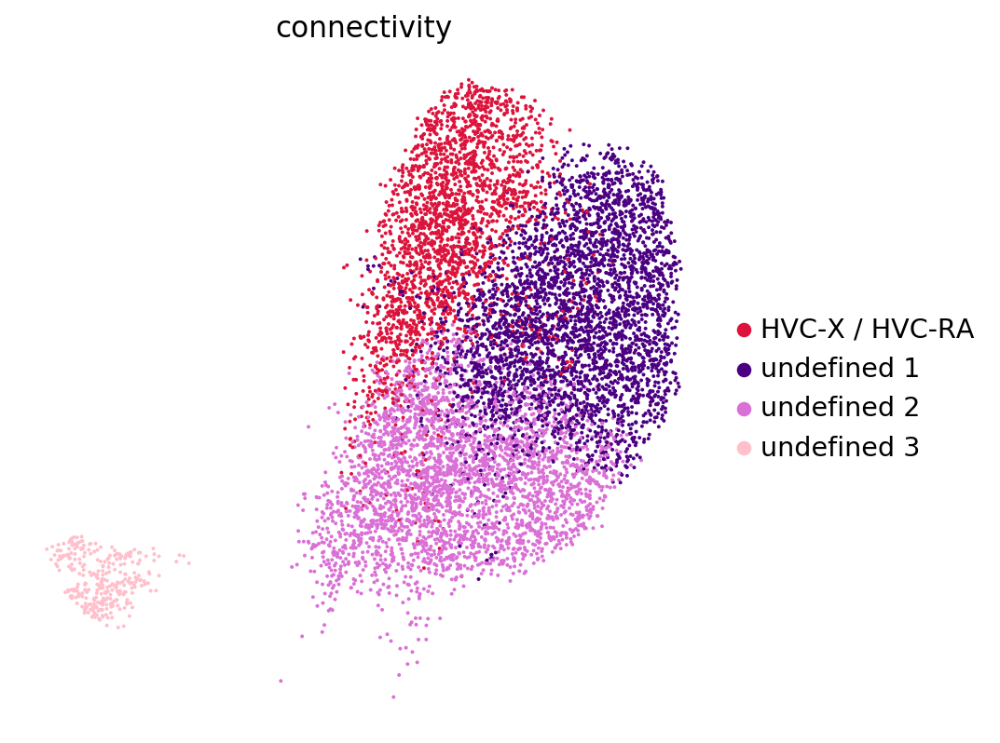

In [191]:
sc.pl.umap(
    adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")],
    color=["connectivity"],
    palette=palette_glut,
    ncols=1
)

This assignment makes sense given that WRE is expressed mostly in WRE (see graph below of WRE expression). We do not know why AAVs target HVC-X more succesfully than HVC-RA neurons, but this coincides with what we previouly observed in the lab based on overlap between viral fluorophore expression and tracers from RA or from X.

In [192]:
markers = [
    "UTS2B_ENSTGUG00000009278.2",
    "HPCAL1_ENSTGUG00000013044.2",
    "ALDH1A2_ENSTGUG00000006178.2",
    "DCN_ENSTGUG00000008178.2",
    "FNDC9_ENSTGUG00000000654.2",
    "NTS_ENSTGUG00000027877.1",
    "SST_ENSTGUG00000027783.1",
    "PVALB_ENSTGUG00000010713.2",
    "CALB1_ENSTGUG00000011825.2",
    "CALB2_ENSTGUG00000005987.2",
    "BDNF_ENSTGUG00000004743.2",
    "FOSL2_ENSTGUG00000024611.1",
    "HOMER1_ENSTGUG00000003711.2",
    "ARC_ENSTGUG00000012727.2",
    "TNFAIP8L3_ENSTGUG00000028388.1",
    "EGR1_ENSTGUG00000000003.2",
]

Trying to set attribute `.uns` of view, copying.


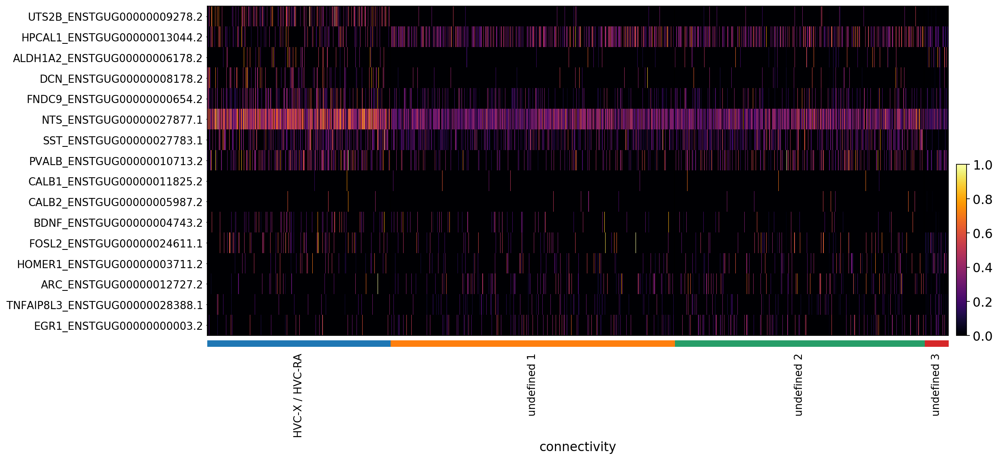

In [193]:
sc.pl.heatmap(
    adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")],
    markers,
    groupby="connectivity",
    show_gene_labels=True,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=True,
    figsize=(15, 7)
)

#### Since only glutamatergic neurons cluster 2 seems to express HVC-X / HVC-RA markers, I will recluster only that cluster (labeled "HVC-X / HVC-RA") to separate HVC-X and HVC-RA neurons in the cluster.

UTS2B (Urotensin 2B): Among its related pathways are Peptide ligand-binding receptors and Signaling by GPCR. Gene Ontology (GO) annotations related to this gene include hormone activity and G protein-coupled receptor binding.  

HPCAL1 (Hippocalcin Like 1): The protein encoded by this gene is a member of neuron-specific calcium-binding proteins family found in the retina and brain. It is highly similar to human hippocalcin protein and nearly identical to the rat and mouse hippocalcin like-1 proteins. It may be involved in the calcium-dependent regulation of rhodopsin phosphorylation and may be of relevance for neuronal signalling in the central nervous system.   

ALDH1A2 (Aldehyde Dehydrogenase 1 Family Member A2): This protein belongs to the aldehyde dehydrogenase family of proteins. The product of this gene is an enzyme that catalyzes the synthesis of retinoic acid (RA) from retinaldehyde. Retinoic acid, the active derivative of vitamin A (retinol), is a hormonal signaling molecule that functions in developing and adult tissues. The studies of a similar mouse gene suggest that this enzyme and the cytochrome CYP26A1, concurrently establish local embryonic retinoic acid levels which facilitate posterior organ development and prevent spina bifida.  

DCN (decorin): This gene encodes a member of the small leucine-rich proteoglycan family of proteins. Alternative splicing results in multiple transcript variants, at least one of which encodes a preproprotein that is proteolytically processed to generate the mature protein. This protein plays a role in collagen fibril assembly. Binding of this protein to multiple cell surface receptors mediates its role in tumor suppression, including a stimulatory effect on autophagy and inflammation and an inhibitory effect on angiogenesis and tumorigenesis.

FNDC9 (Fibronectin Type III Domain Containing 9): Fibronectin is a high-molecular weight glycoprotein of the extracellular matrix that binds to membrane-spanning receptor proteins called integrins (https://en.wikipedia.org/wiki/Fibronectin).

NTS (Neurotensin): This gene encodes a common precursor for two peptides, neuromedin N and neurotensin. Neurotensin is a secreted tridecapeptide, which is widely distributed throughout the central nervous system, and may function as a neurotransmitter or a neuromodulator. It may be involved in dopamine-associated pathophysiological events, in the maintenance of gut structure and function, and in the regulation of fat metabolism. Neurotensin also exhibits antimicrobial activity against bacteria and fungi. Tissue-specific processing may lead to the formation in some tissues of larger forms of neuromedin N and neurotensin. The large forms may represent more stable peptides that are also biologically active.

Info from GeneCards unless otherwise noted.

___

# Save adata with celltype assignment

In [194]:
# adata.obs["connectivity"] = adata.obs["connectivity"].astype(str)
# adata.write("../../finchseq_data/all_celltype.h5ad")

___